In [1]:
import numpy as np
from kymatio.numpy import TimeFrequencyScattering1D
from kymatio.toolkit import echirp, energy
from kymatio.visuals import plot, imshow
from kymatio import visuals
import librosa
import torch, os
%matplotlib inline
import matplotlib.pyplot as plt
from IPython.display import Image

In [2]:
# scattering parameters
J = 12
Q = 16
T = 12
J_fr = 4
Q_fr = 2
F = 8
average_fr = True
pad_mode_fr = 'zero'
out_type = 'dict:array'
oversampling=2

# Modulated chirp

In [3]:
def exp_chirp(duration=2, sr=2**14, f0=110, gamma=0.5):
    t = torch.arange(0, duration, 1/sr)
    phi = f0 / (gamma*np.log(2)) * (2 ** (gamma*t) - 1)
    return torch.sin(2*np.pi*phi)


def sinusoid(duration=2, sr=2**14, f0=110):
    t = torch.arange(0, duration, 1/sr)
    return torch.sin(2 * np.pi * f0 * t)


def generate(f_c, f_m, gamma=0.5, duration=2, sr=2**14):
    x_c = exp_chirp(duration=duration, sr=sr, gamma=gamma, f0=f_c) # carrier chirp
    x_m = sinusoid(duration, sr=sr, f0=f_m)
    x = x_c * x_m * torch.hann_window(duration * sr)
    return x

In [4]:
sr=2**13
x = generate(f_c=200, f_m=20, gamma=4, duration=1, sr=sr)
N = len(x)

In [5]:
params = dict(J=J, Q=Q, T=T, J_fr=J_fr, Q_fr=Q_fr, F=F, average_fr=average_fr,
              out_type=out_type, pad_mode_fr=pad_mode_fr, max_pad_factor=1,
              max_pad_factor_fr=1, oversampling=oversampling, oversampling_fr=2)
jtfs = TimeFrequencyScattering1D(shape=N, **params)
Scx = jtfs(x)

In [6]:
freqs = jtfs.meta()['xi']['S1'][:, -1]
freqs_ax = freqs[:80]*sr
freqs_ax = freqs_ax.astype(int)
oversampling=2
time_ax = np.array(list(range(1,Scx['S1'].squeeze().shape[1]))) * N/sr/Scx['S1'].squeeze().shape[1]

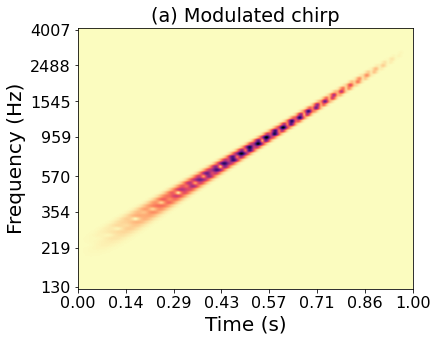

In [7]:
plt.rcParams.update({'font.size': 16})
imshow(Scx['S1'].squeeze()[:80,:], abs=1, w=.5, h=.4, yticks=freqs_ax, cmap='magma_r',
       xticks=time_ax, 
       xlabel="Time (s)",
       ylabel="Frequency (Hz)",
       title='(a) Modulated chirp',
       scalogram=1)

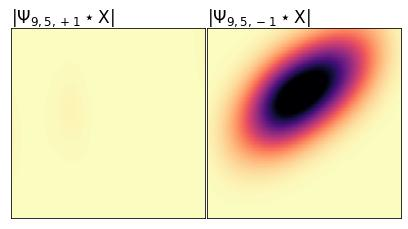

In [8]:
jmeta = jtfs.meta()
savedir = '../img/scale_reate_visual/moduChirp/'
os.makedirs(savedir)
visuals.gif_jtfs_2d(Scx, jmeta, base_name='moduChirp', savedir=savedir, 
                    cmap='magma_r', save_images=1, overwrite=1, 
                    images_ext='.jpg')
Image(savedir+'moduChirp57.jpg')

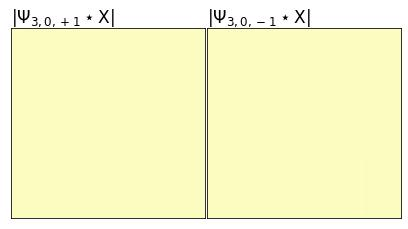

In [9]:
# gif showing all the JTFS at all scale-rate combinations
Image(savedir+'moduChirp.gif')

# Downward glissando

In [10]:
x, sr = librosa.load('../audio/glissando.wav', sr=44100)
x = x[:sr]
N = len(x)

params = dict(J=J, Q=Q, T=T, J_fr=J_fr, Q_fr=Q_fr, F=F, average_fr=average_fr,
              out_type=out_type, pad_mode_fr=pad_mode_fr, max_pad_factor=1,
              max_pad_factor_fr=1, oversampling=oversampling, oversampling_fr=2)
jtfs = TimeFrequencyScattering1D(shape=N, **params)
Scx = jtfs(x)

freqs = jtfs.meta()['xi']['S1'][:, -1]
freqs_ax = freqs[:90]*sr
freqs_ax = freqs_ax.astype(int)
oversampling=2
time_ax = np.array(list(range(1,Scx['S1'].squeeze().shape[1]))) * N/sr/Scx['S1'].squeeze().shape[1]

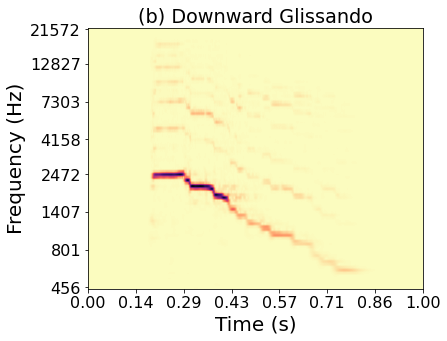

In [11]:
plt.rcParams.update({'font.size': 16})
imshow(Scx['S1'].squeeze()[:90,:], abs=1, w=.5, h=.4, yticks=freqs_ax, cmap='magma_r',
       xticks=time_ax, 
       xlabel="Time (s)",
       ylabel="Frequency (Hz)",
       title='(b) Downward Glissando',
       scalogram=1)

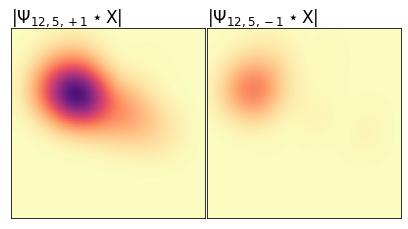

In [12]:
jmeta = jtfs.meta()
savedir = '../img/scale_reate_visual/glissando/'
os.makedirs(savedir)
visuals.gif_jtfs_2d(Scx, jmeta, base_name='glissando', savedir=savedir, 
                    cmap='magma_r', save_images=1, overwrite=1, 
                    images_ext='.jpg', gif_kw=None)
Image(savedir+'glissando84.jpg')

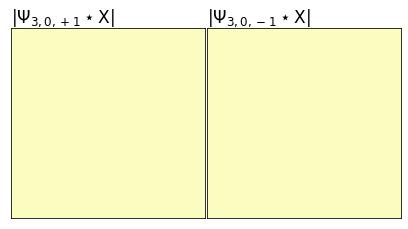

In [13]:
# gif showing all the JTFS at all scale-rate combinations
Image(savedir+'glissando.gif')

# Laughing gull

In [14]:
x, sr = librosa.load('../audio/laughinggull.wav', sr=44100)
x = x[:sr]
N = len(x)

params = dict(J=J, Q=Q, T=T, J_fr=J_fr, Q_fr=Q_fr, F=F, average_fr=average_fr,
              out_type=out_type, pad_mode_fr=pad_mode_fr, max_pad_factor=1,
              max_pad_factor_fr=1, oversampling=oversampling, oversampling_fr=2)
jtfs = TimeFrequencyScattering1D(shape=N, **params)
Scx = jtfs(x)

freqs = jtfs.meta()['xi']['S1'][:, -1]
freqs_ax = freqs[20:90]*sr
freqs_ax = freqs_ax.astype(int)
oversampling=2
time_ax = np.array(list(range(1,Scx['S1'].squeeze().shape[1]))) * N/sr/Scx['S1'].squeeze().shape[1]

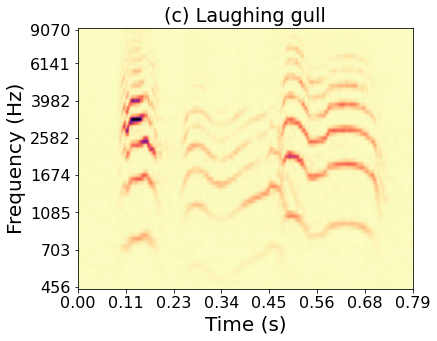

In [15]:
plt.rcParams.update({'font.size': 16})
imshow(Scx['S1'].squeeze()[20:90,:], abs=1, w=.5, h=.4, yticks=freqs_ax, cmap='magma_r',
       xticks=time_ax, 
       xlabel="Time (s)",
       ylabel="Frequency (Hz)",
       title='(c) Laughing gull',
       scalogram=1)

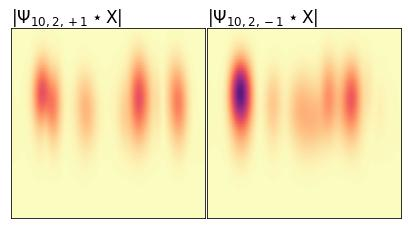

In [16]:
jmeta = jtfs.meta()
savedir = '../img/scale_reate_visual/laughinggull/'
os.makedirs(savedir)
visuals.gif_jtfs_2d(Scx, jmeta, base_name='laughinggull', savedir=savedir, 
                    cmap='magma_r', save_images=1, overwrite=1, 
                    images_ext='.jpg', gif_kw=None)
Image(savedir+'laughinggull63.jpg')

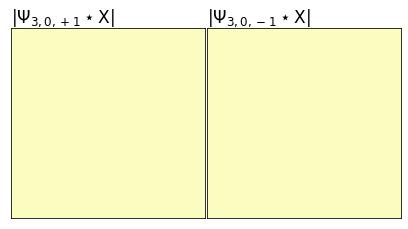

In [17]:
# gif showing all the JTFS at all scale-rate combinations
Image(savedir+'laughinggull.gif')

# Northern goshawk

In [18]:
x, sr = librosa.load('../audio/goshawk.wav', sr=44100)
x = x[:sr]
N = len(x)

params = dict(J=J, Q=Q, T=T, J_fr=J_fr, Q_fr=Q_fr, F=F, average_fr=average_fr,
              out_type=out_type, pad_mode_fr=pad_mode_fr, max_pad_factor=1,
              max_pad_factor_fr=1, oversampling=oversampling, oversampling_fr=2)
jtfs = TimeFrequencyScattering1D(shape=N, **params)
Scx = jtfs(x)

freqs = jtfs.meta()['xi']['S1'][:, -1]
freqs_ax = freqs[20:75]*sr
freqs_ax = freqs_ax.astype(int)
oversampling=2
time_ax = np.array(list(range(1,Scx['S1'].squeeze().shape[1]))) * N/sr/Scx['S1'].squeeze().shape[1]

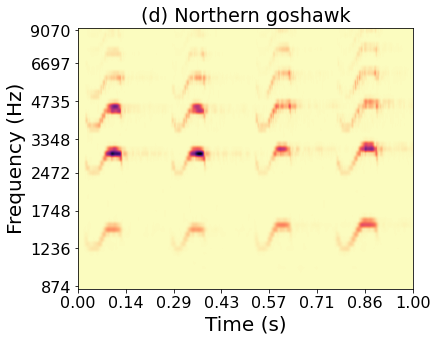

In [19]:
plt.rcParams.update({'font.size': 16})
imshow(Scx['S1'].squeeze()[20:75,:], abs=1, w=.5, h=.4, yticks=freqs_ax, cmap='magma_r',
       xticks=time_ax, 
       xlabel="Time (s)",
       ylabel="Frequency (Hz)",
       title='(d) Northern goshawk',
       scalogram=1)

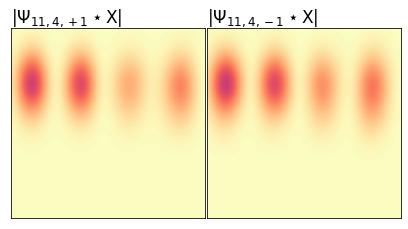

In [20]:
jmeta = jtfs.meta()
savedir = '../img/scale_reate_visual/goshawk/'
os.makedirs(savedir)
visuals.gif_jtfs_2d(Scx, jmeta, base_name='goshawk', savedir=savedir, 
                    cmap='magma_r', save_images=1, overwrite=1, 
                    images_ext='.jpg', gif_kw=None)
Image(savedir+'goshawk74.jpg')

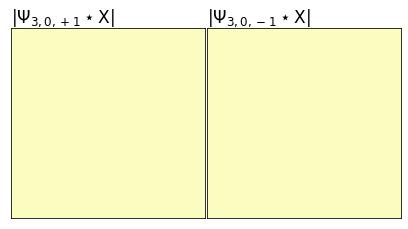

In [21]:
Image(savedir+'goshawk.gif')